In [34]:
import os
import sys
import requests

import mercury
from dotenv import load_dotenv

import networkx as nx

import pandas as pd
from pandas import json_normalize

import matplotlib.pyplot as plt
# from elasticsearch import Elasticsearch as es

In [18]:
# Load app for json display
mercury.App(title="Display JSON", static_notebook=True)

# Load server environment
load_dotenv(os.path.dirname(sys.path[1]) + '/server/.env')

mercury.App

True

# 🗄️ Data

In [19]:
# Elastic search info
SCANR_API_URL = 'https://scanr-api.enseignementsup-recherche.gouv.fr/elasticsearch/publications/_search'
SCANR_API_TOKEN = os.environ.get('SCANR_API_TOKEN')
header = {'Authorization': SCANR_API_TOKEN}

## Structure

Get single entry

In [20]:
# Query json
json_query = {
  "query": {
    "simple_query_string" : {
        "query": "halhal-02787691",
        "fields": ["_id"]
    }
  }
}

# Request answer
json_answer = requests.post(SCANR_API_URL, json=json_query, headers=header).json()

Display answer

In [21]:
# Display json
mercury.JSON(json_answer)

## Analysis

Count ? Variable descriptions ? Completion ?

## Requests

Search by keywords

In [22]:
# Keywords list
keywords = ['capillarity']

# Create query block
must_block = []
for q in keywords :
    must_block.append( {
                    "query_string": {
                        "fields": ["title.default",
                        "title.fr", "title.en",
                                   "keywords.en", "keywords.fr", "keywords.default",
                                   "domains.label.default", "domains.label.fr", "domains.label.en",
                                   "summary.default", "summary.fr", "summary.en",
                                  "alternativeSummary.default", "alternativeSummary.fr", "alternativeSummary.en"],
                        "query": f'"{q}"'
                    }})

# Query json
json_query = {
        "size": 10000,
        "query": {
            "bool": {
                "filter":[
                                   {
                       "terms": {"authors.role.keyword": ["author", "directeurthese"]}
                    },
                    {
                       "terms": {"year": [2018, 2019, 2020, 2021, 2022, 2023]}
                    } 
                ],
                "must": must_block
            }
        },
        "aggs":{
            "idref":{ "terms": {
                "field": "authors.person.id.keyword",
                "size":10
            }
                    }
        }
    }

# Request answer
json_answer = requests.post(SCANR_API_URL, json=json_query, headers=header).json()

Display answer

In [23]:
# Display json
mercury.JSON(json_answer)

In [24]:
# Answer info
agg_key_number = len(json_answer['aggregations']['idref']['buckets'])
hits_number = len(json_answer['hits']['hits'])

print("Number of aggregations keys :", agg_key_number)
print("Number of hits :", hits_number)

Number of aggregations keys : 10
Number of hits : 204


# 🌐 Network

## Structure

* Nodes = authors
* Edges = (co)publications

## Creation

Clean answer and create graph

In [32]:
# Filter params
NB_MAX_COAUTHORS = 20
NB_MIN_PUBLICATIONS = 5

# Init network variable
fullNameIdref = {}
all_edges = {}
nb_pub_removed = 0
nb_aut_removed = 0

# Create graph
G = nx.Graph()

# Filter data
# 1. Loop over answers
for hit in json_answer['hits']['hits']:
    elt = hit['_source']
    authors = elt.get('authors')

    # 2. Loop over authors and remove publication if too many coauthors
    if len(authors) > NB_MAX_COAUTHORS:
        print('{}: removing publication ({} authors)'.format(hit['_source']['id'], len(authors)))
        nb_pub_removed += 1
        continue
    
    # 3. Define a node for each author if fullname exists
    currentNodes = []
    for aut in elt.get('authors'):
        if 'person' in aut:
            idref = aut['person']['id']
            if idref not in fullNameIdref:
                fullNameIdref[idref] = aut['fullName']
            currentNode = fullNameIdref[idref]
        elif 'fullName' in aut:
            currentNode = aut['fullName']
        else:
            continue
        currentNodes.append(currentNode)
    
    # 4. Update nodes informations
    for node in currentNodes:
        # Add node or increment publication number
        if node not in all_edges:
            all_edges[node] = {'nb_publis': 0, 'coauthors':{}}
        all_edges[node]['nb_publis'] += 1
        # Compute number of coauthors
        for node_ in currentNodes:
            if node != node_ :
                if node_ not in  all_edges[node]['coauthors']:
                    all_edges[node]['coauthors'][node_] = 0
                all_edges[node]['coauthors'][node_] += 1
                
# 5. Add nodes to graph object       
for n in all_edges:
    # Filter by number of publications
    if all_edges[n]['nb_publis'] < NB_MIN_PUBLICATIONS:
        nb_aut_removed += 1
        continue
    # Add nodes
    G.add_node(n, size = all_edges[n]['nb_publis'])
    # Add weights (number of co publications)
    for m in all_edges[n]['coauthors']:
        G.add_edge(n, m, weight = all_edges[n]['coauthors'][m])

print('\nNumber of publications :', len(json_answer['hits']['hits']))
print('Number of publications removed (too many coauthors) :', nb_pub_removed)
print('Number of authors removed (too few publications) :', nb_aut_removed)
print('\nGraph - number of nodes (authors) :', G.number_of_nodes())
print('Graph - number of edges (copublications) :', G.number_of_edges())


doi10.1073/pnas.1901619116: removing publication (28 authors)

Number of publications : 204
Number of publications removed (too many coauthors) : 1
Number of authors removed (too few publications) : 760

Graph - number of nodes (authors) : 76
Graph - number of edges (copublications) : 93


# 👥 Communities

## Structure

## Creation

## Analysis

# 🖼️ Visualisation

## Matplotlib

Display network

In [47]:
all_edges['Howard Stone']

{'nb_publis': 3,
 'coauthors': {'Vincent Bertin': 3,
  'Thomas Salez': 4,
  'Elie Raphael': 4,
  'David Dean': 2,
  'Isabelle Cantat': 2,
  'Dominic Vella': 2,
  'Elisabeth Charlaix': 1,
  'Joelle Frechette': 1,
  'John Niven': 2,
  'Kari Dalnoki-Veress': 2}}

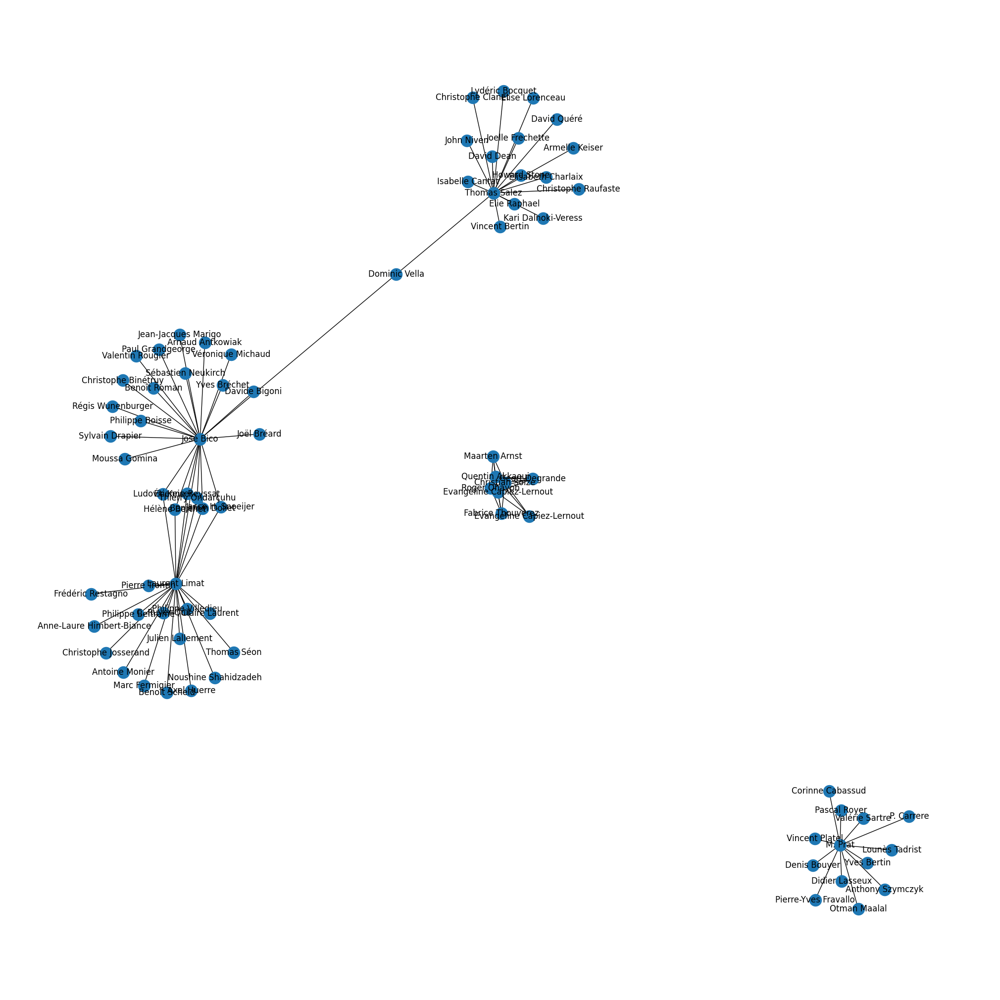

In [44]:
# Draw network
plt.figure(figsize=(20,20))
nx.draw(G, with_labels = True)
plt.draw()